In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Loan dataset

## EDA

In [2]:
loan = pd.read_csv('/Users/suzylau/Downloads/archive-4/lc_loan.csv')

/var/folders/66/qq6y4h9x2v91kpgp9hv1rh3r0000gn/T/ipykernel_46758/260063563.py:1: DtypeWarning: Columns (19,55) have mixed types. Specify dtype option on import or set low_memory=False.
  loan = pd.read_csv('/Users/suzylau/Downloads/archive-4/lc_loan.csv')


In [3]:
loan.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,1077501,1296599,5000.0,5000.0,4975.0,36 months,10.65,162.87,B,B2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1077430,1314167,2500.0,2500.0,2500.0,60 months,15.27,59.83,C,C4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1077175,1313524,2400.0,2400.0,2400.0,36 months,15.96,84.33,C,C5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1076863,1277178,10000.0,10000.0,10000.0,36 months,13.49,339.31,C,C1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1075358,1311748,3000.0,3000.0,3000.0,60 months,12.69,67.79,B,B5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [5]:
loan.isnull().sum().sort_values(ascending=False)

dti_joint                      886870
annual_inc_joint               886868
verification_status_joint      886868
il_util                        868762
mths_since_rcnt_il             866569
open_acc_6m                    866007
open_il_6m                     866007
open_il_12m                    866007
open_il_24m                    866007
total_bal_il                   866007
inq_last_12m                   866007
open_rv_12m                    866007
open_rv_24m                    866007
max_bal_bc                     866007
all_util                       866007
inq_fi                         866007
total_cu_tl                    866007
desc                           761351
mths_since_last_record         750326
mths_since_last_major_derog    665676
mths_since_last_delinq         454312
next_pymnt_d                   252971
tot_coll_amt                    70276
tot_cur_bal                     70276
total_rev_hi_lim                70276
emp_title                       51462
emp_length  

In [6]:
loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 887379 entries, 0 to 887378
Data columns (total 74 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           887379 non-null  int64  
 1   member_id                    887379 non-null  int64  
 2   loan_amnt                    887379 non-null  float64
 3   funded_amnt                  887379 non-null  float64
 4   funded_amnt_inv              887379 non-null  float64
 5   term                         887379 non-null  object 
 6   int_rate                     887379 non-null  float64
 7   installment                  887379 non-null  float64
 8   grade                        887379 non-null  object 
 9   sub_grade                    887379 non-null  object 
 10  emp_title                    835917 non-null  object 
 11  emp_length                   842554 non-null  object 
 12  home_ownership               887379 non-null  object 
 13 

In [3]:
col_null = ['dti_joint','annual_inc_joint','verification_status_joint','il_util',
            'mths_since_rcnt_il','open_acc_6m','open_il_6m','open_il_12m','open_il_24m',
            'total_bal_il','inq_last_12m','open_rv_12m','open_rv_24m','max_bal_bc','all_util',
            'inq_fi','total_cu_tl']
loan = loan.drop(columns=col_null, axis=1)

In [4]:
col_obj = ['grade','term','sub_grade','emp_title','emp_length','home_ownership','verification_status','issue_d',
          'loan_status','pymnt_plan','url','desc','purpose','title','zip_code','addr_state','earliest_cr_line','initial_list_status',
          'last_pymnt_d','next_pymnt_d','last_credit_pull_d','application_type']
loan = loan.drop(columns=col_obj,axis=1)

In [5]:
loan = loan.drop(columns=['mths_since_last_delinq', 'mths_since_last_record',
                           'mths_since_last_major_derog', 'tot_coll_amt', 'tot_cur_bal',
                           'total_rev_hi_lim'], axis=1)

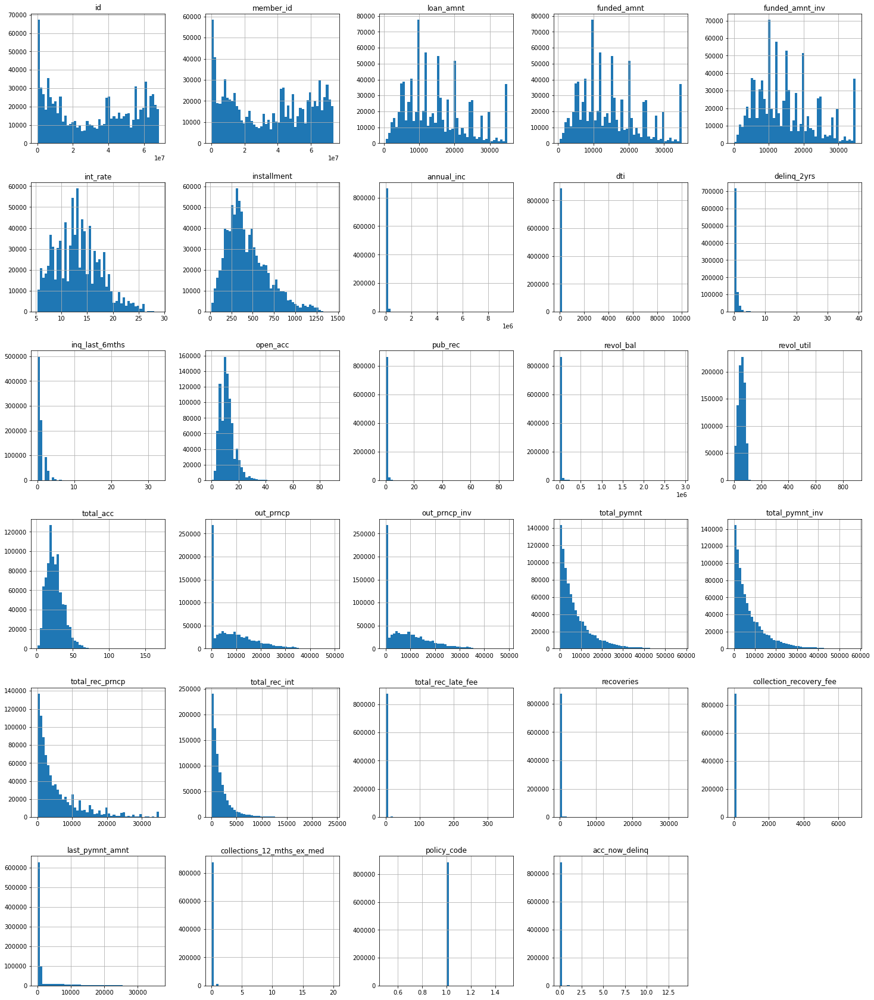

In [10]:
loan.hist(figsize=(25, 30), bins=50, xlabelsize=10, ylabelsize=10)
plt.show()

In [10]:
!pip install -q hvplot

In [11]:
import hvplot.pandas

In [12]:
dti = loan[loan['dti']<=50].hvplot.hist(
    y='dti', bins=50, width=300, height=350, 
    title="dti (<=30) Distribution", xlabel='dti', ylabel='Count', 
    alpha=0.3, legend='top'
)

dti

:Histogram   [dti]   (dti_count)

In [9]:
loan[loan.annual_inc <= 250000].hvplot.hist(
    y='annual_inc', bins=50, alpha=0.3, width=500, height=400,
    title="Annual Income (<= 250000/Year)", 
    xlabel='Annual Income', ylabel='Loans Counts', legend='top'
).opts(xrotation=45)

:Histogram   [annual_inc]   (annual_inc_count)

## Deal with missing values

In [13]:
loan.isnull().sum().sort_values(ascending=False)

revol_util                    502
collections_12_mths_ex_med    145
delinq_2yrs                    29
total_acc                      29
pub_rec                        29
open_acc                       29
inq_last_6mths                 29
acc_now_delinq                 29
annual_inc                      4
dti                             0
total_pymnt_inv                 0
policy_code                     0
loan_amnt                       0
last_pymnt_amnt                 0
collection_recovery_fee         0
recoveries                      0
total_rec_late_fee              0
total_rec_int                   0
total_rec_prncp                 0
total_pymnt                     0
out_prncp_inv                   0
out_prncp                       0
funded_amnt                     0
member_id                       0
revol_bal                       0
funded_amnt_inv                 0
int_rate                        0
installment                     0
id                              0
dtype: int64

In [6]:
loan[['revol_util', 'collections_12_mths_ex_med', 'delinq_2yrs','total_acc', 'pub_rec', 'open_acc', 'inq_last_6mths', 'acc_now_delinq', 'annual_inc' ]] = loan[['revol_util', 'collections_12_mths_ex_med', 'delinq_2yrs','total_acc', 'pub_rec', 'open_acc', 'inq_last_6mths', 'acc_now_delinq', 'annual_inc' ]].fillna(
    round(loan[['revol_util', 'collections_12_mths_ex_med', 'delinq_2yrs','total_acc', 'pub_rec', 'open_acc', 'inq_last_6mths', 'acc_now_delinq', 'annual_inc' ]].mean())
)

In [7]:
loan.isnull().sum().sort_values(ascending=False)

id                            0
total_acc                     0
policy_code                   0
collections_12_mths_ex_med    0
last_pymnt_amnt               0
collection_recovery_fee       0
recoveries                    0
total_rec_late_fee            0
total_rec_int                 0
total_rec_prncp               0
total_pymnt_inv               0
total_pymnt                   0
out_prncp_inv                 0
out_prncp                     0
revol_util                    0
member_id                     0
revol_bal                     0
pub_rec                       0
open_acc                      0
inq_last_6mths                0
delinq_2yrs                   0
dti                           0
annual_inc                    0
installment                   0
int_rate                      0
funded_amnt_inv               0
funded_amnt                   0
loan_amnt                     0
acc_now_delinq                0
dtype: int64

In [18]:
# Correlation analysis
correlations = loan.corr(method='pearson')
print(correlations)

                                  id  member_id  loan_amnt  funded_amnt  \
id                          1.000000   0.999443   0.063803     0.066058   
member_id                   0.999443   1.000000   0.064461     0.066754   
loan_amnt                   0.063803   0.064461   1.000000     0.999263   
funded_amnt                 0.066058   0.066754   0.999263     1.000000   
funded_amnt_inv             0.071502   0.072308   0.997115     0.998025   
int_rate                   -0.142963  -0.142205   0.145023     0.145160   
installment                 0.025347   0.026036   0.944977     0.946005   
annual_inc                  0.033990   0.034146   0.332697     0.332466   
dti                         0.067781   0.067824   0.020675     0.021075   
delinq_2yrs                 0.049663   0.049919  -0.000143     0.000167   
inq_last_6mths             -0.126960  -0.127267  -0.034180    -0.034723   
open_acc                    0.088714   0.088831   0.198896     0.199378   
pub_rec                  

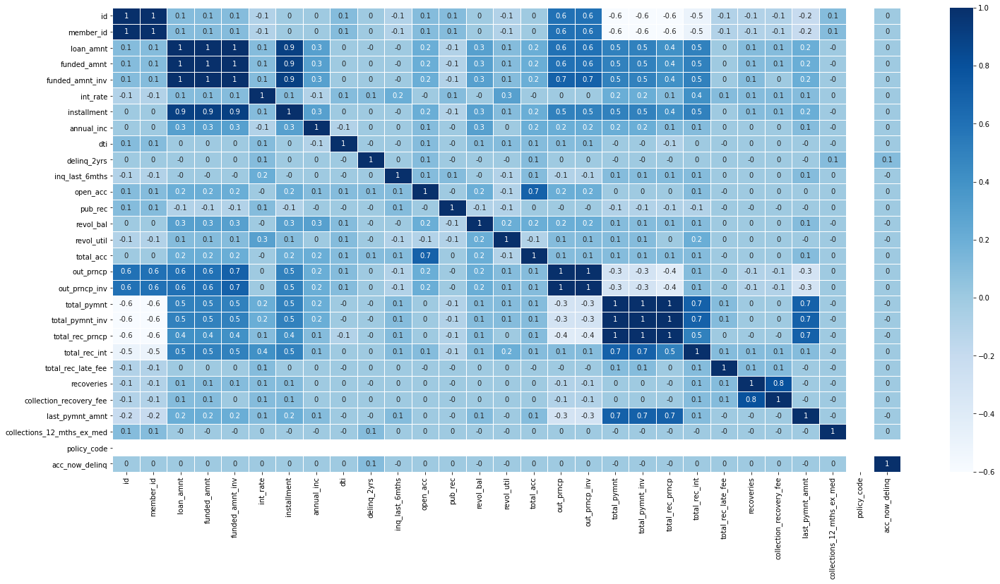

In [19]:
plt.figure(figsize=(25,12.10))
sns.heatmap(round(loan.corr(),1),annot=True,cmap='Blues',linewidth=0.9)
plt.show();

## Baseline

In [8]:
!pip install sdv

In [9]:
from sdv.tabular import CTGAN

In [10]:
from ctgan import CTGANSynthesizer

In [30]:
model = CTGANSynthesizer(verbose=True)

In [31]:
loan = loan.head(10000)

In [13]:
model.fit(loan, epochs = 100)

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter,

Epoch 1, Loss G: -0.0833,Loss D: -1.2160
Epoch 2, Loss G: -0.8339,Loss D: -0.1855
Epoch 3, Loss G: -1.0564,Loss D:  0.1249
Epoch 4, Loss G: -1.2758,Loss D:  0.1833
Epoch 5, Loss G: -1.2341,Loss D:  0.2086
Epoch 6, Loss G: -0.7851,Loss D:  0.2222
Epoch 7, Loss G: -0.6704,Loss D: -0.1897
Epoch 8, Loss G: -1.3180,Loss D:  0.2837
Epoch 9, Loss G: -1.5737,Loss D:  0.2854
Epoch 10, Loss G: -1.7433,Loss D:  0.2301
Epoch 11, Loss G: -1.8069,Loss D:  0.2602
Epoch 12, Loss G: -2.0175,Loss D:  0.2127
Epoch 13, Loss G: -2.1601,Loss D: -0.0593
Epoch 14, Loss G: -2.3129,Loss D:  0.2505
Epoch 15, Loss G: -2.3361,Loss D:  0.1018
Epoch 16, Loss G: -2.0748,Loss D:  0.3503
Epoch 17, Loss G: -2.4286,Loss D: -0.0319
Epoch 18, Loss G: -2.9508,Loss D:  0.0735
Epoch 19, Loss G: -3.5920,Loss D:  0.1190
Epoch 20, Loss G: -3.3192,Loss D: -0.0573
Epoch 21, Loss G: -3.3492,Loss D: -0.2440
Epoch 22, Loss G: -2.6465,Loss D: -0.0732
Epoch 23, Loss G: -3.6316,Loss D:  0.3282
Epoch 24, Loss G: -3.5421,Loss D:  0.0886
E

In [14]:
new_data = model.sample(10000)
print(new_data.head())

        id  member_id     loan_amnt   funded_amnt  funded_amnt_inv   int_rate  \
0  1055399    1157582  25128.478568   3855.582872      5775.528837   6.326234   
1   841021    1262348  11215.067927  11529.153951     16680.094786  16.515185   
2   974439    1120775   8486.318279   4295.374795      8275.517661   9.229004   
3  1009589    1074879    166.759523   3908.767512      1806.345228   5.586760   
4   869246    1079960  29833.137554  18211.846199      9250.162844   6.830739   

   installment    annual_inc        dti  delinq_2yrs  ...  total_pymnt_inv  \
0    18.074667  23352.278219  14.922910     0.000520  ...      1511.673240   
1   371.096853  95473.172192  12.716155     0.933666  ...     18451.006813   
2   196.714186  46641.061199  13.927895    -0.000435  ...      5105.359412   
3   100.134658  67379.027561  17.047626    -0.009744  ...     12722.793902   
4   132.268412  81778.567808  16.097862    -0.008297  ...     33985.890555   

   total_rec_prncp  total_rec_int  total_rec

In [32]:
from sdv.evaluation import evaluate

In [16]:
evaluate(new_data, loan)

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/

0.5224867434453903

(10000, 29) (10000, 29)


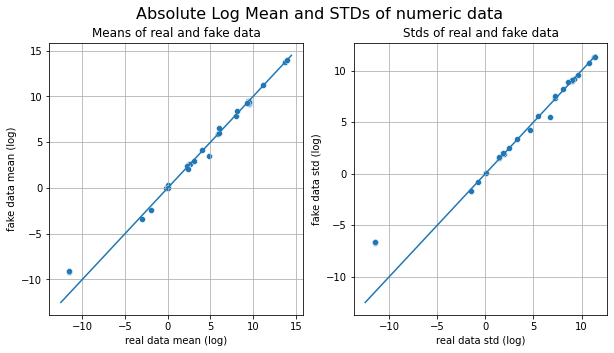

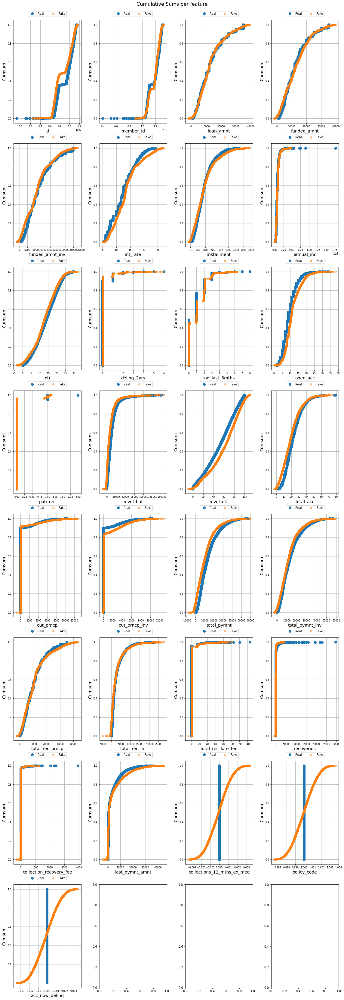

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:156: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  plot_df = pd.DataFrame({col: self.real[col].append(self.fake[col]), 'kind': ['real'] * self.n_samples + ['fake'] * self.n_samples})
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:156: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  plot_df = pd.DataFrame({col: self.real[col].append(self.fake[col]), 'kind': ['real'] * self.n_samples + ['fake'] * self.n_samples})
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:156: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

In [ ]:
from table_evaluator import load_data, TableEvaluator

print(loan.shape, new_data.shape)
table_evaluator =  TableEvaluator(loan, new_data)

table_evaluator.visual_evaluation()

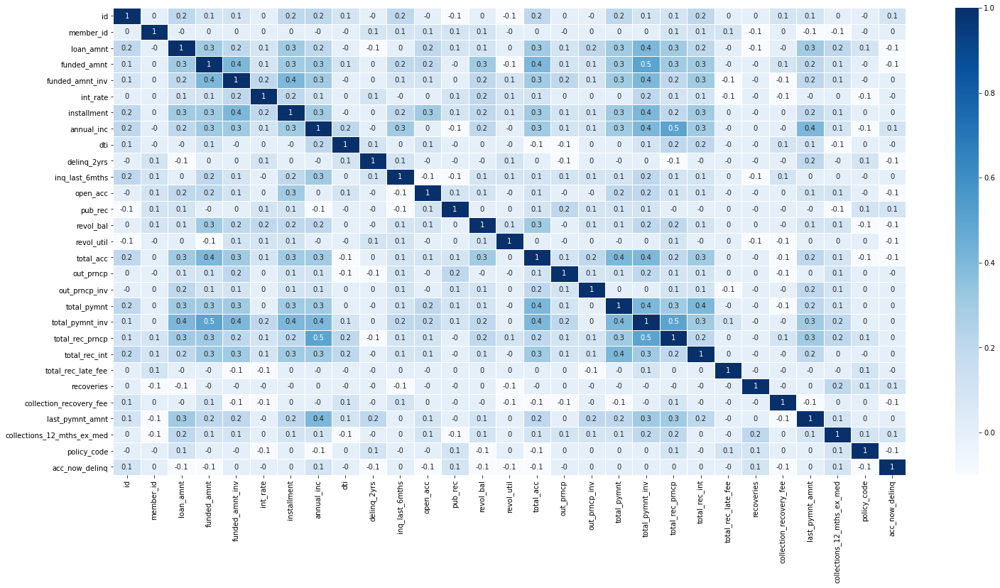

In [22]:
plt.figure(figsize=(25,12.10))
sns.heatmap(round(new_data.corr(),1),annot=True,cmap='Blues',linewidth=0.9)
plt.show()

## Data preprocessing 

In [1]:
## Deal with outliers
import seaborn as sns

In [31]:
plt.rcParams.update({'figure.max_open_warning': 0})

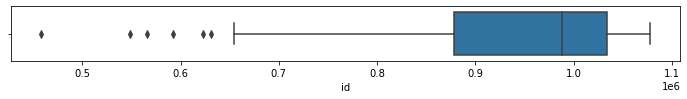

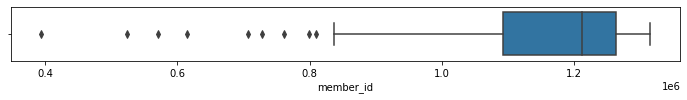

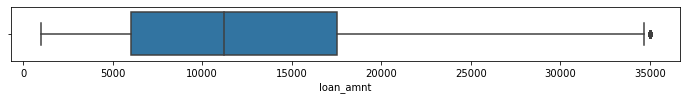

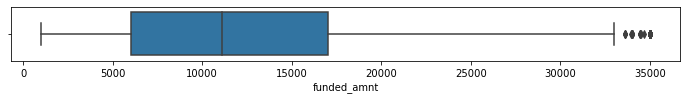

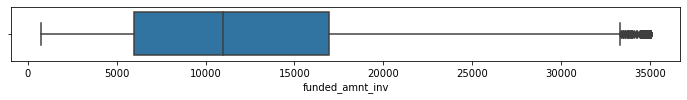

...

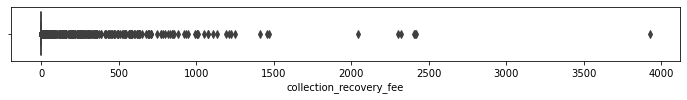

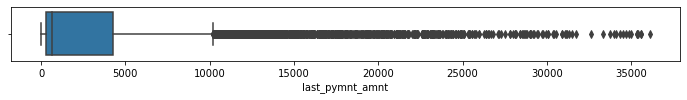

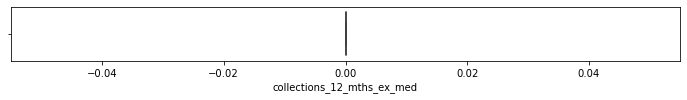

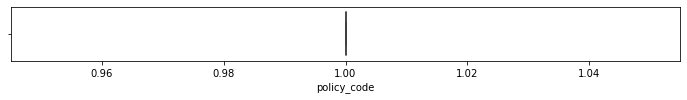

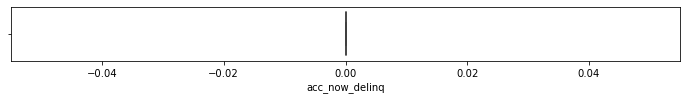

In [32]:
df=loan.select_dtypes(exclude=['object'])
for column in df:
        plt.figure(figsize=(12,1))
        sns.boxplot(data=loan, x=column)

In [25]:
Q1 = loan.quantile(0.25)
Q3 = loan.quantile(0.75)
IQR = Q3 - Q1
((loan < (Q1 - 1.5 * IQR)) | (loan > (Q3 + 1.5 * IQR))).sum()

id                                 0
member_id                          0
loan_amnt                          0
funded_amnt                        0
funded_amnt_inv                    0
int_rate                        6308
installment                    23149
annual_inc                     39719
dti                               81
delinq_2yrs                   170389
inq_last_6mths                 53834
open_acc                       27478
pub_rec                       135778
revol_bal                      48649
revol_util                        51
total_acc                      18232
out_prncp                       3363
out_prncp_inv                   3311
total_pymnt                    46324
total_pymnt_inv                46390
total_rec_prncp                56944
total_rec_int                  63836
total_rec_late_fee             12517
recoveries                     24677
collection_recovery_fee        23507
last_pymnt_amnt               156617
collections_12_mths_ex_med     11681
p

In [29]:
def outliers(x): 
       return np.abs(x- x.median()) > 1.5*(x.quantile(.75)-x.quantile(0.25))

In [30]:
# Replace the upper outlier(s) with the 95th percentile and the lower one(s) with the 5th percentile 
def replace(x): 
       out = x[outliers(x)]
       return x.replace(to_replace = [out.min(),out.max()], 
                        value = [np.percentile(x,5),np.percentile(x,95)])


loan = loan.apply(replace,axis=1)

## Feature engineering

In [17]:
#Normalization
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(loan)

MinMaxScaler()

In [18]:
scaled_data = scaler.transform(loan)

In [19]:
scaled_data = pd.DataFrame(scaled_data, columns=loan.columns)

In [10]:
np.round(scaled_data.describe(),2)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,...,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,policy_code,acc_now_delinq
count,887379.00,887379.00,887379.00,887379.00,887379.00,887379.00,887379.00,887379.00,887379.0,887379.00,...,887379.00,887379.00,887379.00,887379.00,887379.00,887379.00,887379.00,887379.00,887379.0,887379.00
mean,0.47,0.48,0.41,0.41,0.42,0.33,0.29,0.01,0.0,0.01,...,0.13,0.16,0.07,0.00,0.00,0.00,0.06,0.00,0.0,0.00
std,0.33,0.33,0.24,0.24,0.24,0.19,0.17,0.01,0.0,0.02,...,0.14,0.19,0.09,0.01,0.01,0.01,0.13,0.01,0.0,0.01
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00
25%,0.13,0.15,0.22,0.22,0.23,0.20,0.17,0.00,0.0,0.00,...,0.03,0.03,0.02,0.00,0.00,0.00,0.01,0.00,0.0,0.00
50%,0.50,0.50,0.36,0.36,0.37,0.32,0.26,0.01,0.0,0.00,...,0.08,0.09,0.04,0.00,0.00,0.00,0.01,0.00,0.0,0.00
75%,0.80,0.79,0.57,0.57,0.57,0.46,0.39,0.01,0.0,0.00,...,0.18,0.23,0.09,0.00,0.00,0.00,0.02,0.00,0.0,0.00
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.0,1.00,...,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.0,1.00


In [20]:
#Transformation
from sklearn.preprocessing import PowerTransformer
log = PowerTransformer()
log.fit(loan[['total_pymnt']])
loan['l_total_pymnt'] = log.transform(loan[['total_pymnt']])

In [21]:
import seaborn as sns
import scipy.stats as stats

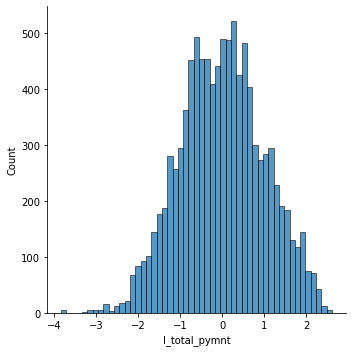

In [22]:
sns.displot(loan['l_total_pymnt'])

In [23]:
log.fit(loan[['total_pymnt_inv']])
loan['l_total_pymnt_inv'] = log.transform(loan[['total_pymnt_inv']])

log.fit(loan[['total_rec_prncp']])
loan['l_total_rec_prncp'] = log.transform(loan[['total_rec_prncp']])

log.fit(loan[['total_rec_int']])
loan['l_total_rec_int'] = log.transform(loan[['total_rec_int']])

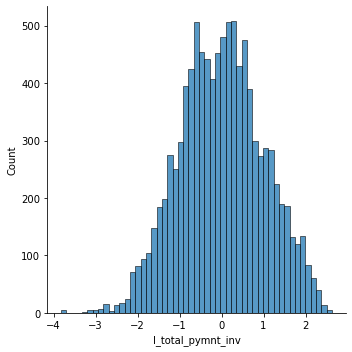

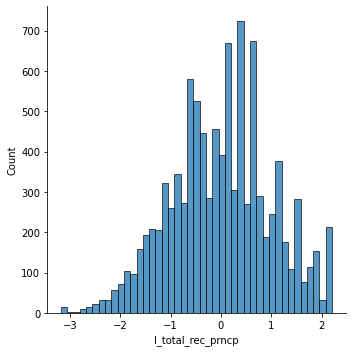

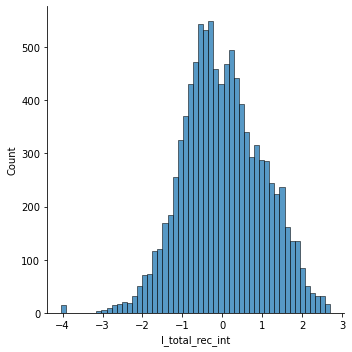

In [23]:
sns.displot(loan['l_total_pymnt_inv'])
sns.displot(loan['l_total_rec_prncp'])
sns.displot(loan['l_total_rec_int'])

In [24]:
loan = loan.drop(columns=['total_pymnt_inv', 'total_pymnt', 'total_rec_prncp', 'total_rec_int'], axis=1)

In [33]:
model.fit(loan, epochs = 100)

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter,

Epoch 1, Loss G:  0.0197,Loss D: -1.2411
Epoch 2, Loss G: -0.6054,Loss D: -0.3052
Epoch 3, Loss G: -0.9019,Loss D:  0.3286
Epoch 4, Loss G: -0.9620,Loss D:  0.0833
Epoch 5, Loss G: -1.3773,Loss D:  0.2366
Epoch 6, Loss G: -1.4379,Loss D:  0.1885
Epoch 7, Loss G: -1.2154,Loss D:  0.1740
Epoch 8, Loss G: -1.0927,Loss D:  0.1644
Epoch 9, Loss G: -1.4455,Loss D:  0.1679
Epoch 10, Loss G: -1.4669,Loss D: -0.1045
Epoch 11, Loss G: -2.2387,Loss D: -0.0372
Epoch 12, Loss G: -2.1262,Loss D:  0.1256
Epoch 13, Loss G: -2.3946,Loss D:  0.1177
Epoch 14, Loss G: -2.8948,Loss D: -0.0392
Epoch 15, Loss G: -3.2969,Loss D: -0.1467
Epoch 16, Loss G: -3.6769,Loss D:  0.0099
Epoch 17, Loss G: -3.5253,Loss D:  0.0779
Epoch 18, Loss G: -2.9956,Loss D:  0.1788
Epoch 19, Loss G: -2.6340,Loss D: -0.1409
Epoch 20, Loss G: -3.2662,Loss D: -0.0517
Epoch 21, Loss G: -3.1662,Loss D: -0.0947
Epoch 22, Loss G: -3.4096,Loss D:  0.0776
Epoch 23, Loss G: -2.9647,Loss D: -0.2016
Epoch 24, Loss G: -3.8276,Loss D:  0.2042
E

In [37]:
new_data2 = model.sample(10000)
print(new_data2.head())

        id   funded_amnt   int_rate  installment     annual_inc        dti  \
0  1068747  10183.384544  13.357926    74.145763   28201.149208  13.748128   
1   955638   3980.593731   4.872942   510.222869   68689.577008  22.633608   
2   873684  34151.642982  14.713055  1170.274284  159229.367893   6.888114   
3  1036519   6212.466270   5.421110   385.647395   51989.690086  13.916360   
4  1025882  19136.685891  10.998835   497.999571   94568.730359  12.742376   

   delinq_2yrs  inq_last_6mths   open_acc   pub_rec  ...  policy_code  \
0    -0.005741        0.981095   3.984160  0.000506  ...     0.999736   
1    -0.012190       -0.055077  12.664310  0.000695  ...     0.997986   
2    -0.004713        1.007548  26.609417  0.006449  ...     1.001249   
3    -0.013457        0.961924  14.299084  0.004989  ...     0.999065   
4    -0.000670        1.925196  16.175328  0.004856  ...     1.000187   

   acc_now_delinq  l_total_pymnt  l_total_pymnt_inv  l_total_rec_prncp  \
0        0.000847 

In [38]:
evaluate(new_data2, loan)

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/

0.4182865645634035

(10000, 29) (10000, 29)


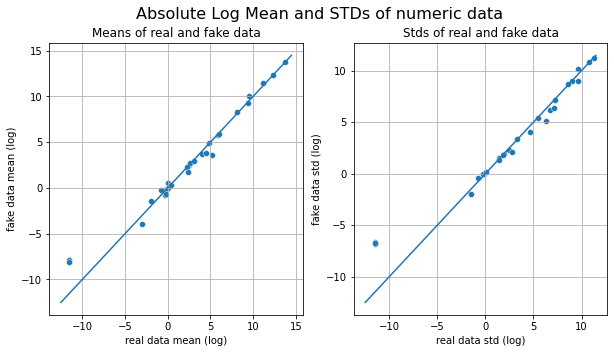

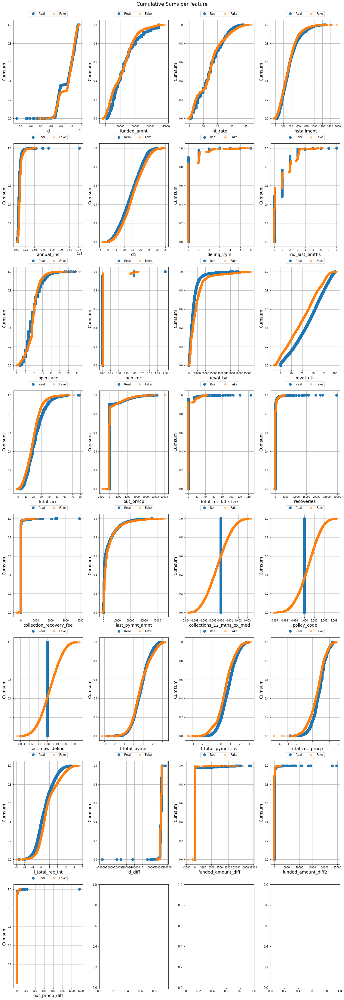

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:156: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  plot_df = pd.DataFrame({col: self.real[col].append(self.fake[col]), 'kind': ['real'] * self.n_samples + ['fake'] * self.n_samples})
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:156: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  plot_df = pd.DataFrame({col: self.real[col].append(self.fake[col]), 'kind': ['real'] * self.n_samples + ['fake'] * self.n_samples})
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:156: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

In [ ]:
from table_evaluator import load_data, TableEvaluator

print(loan.shape, new_data2.shape)
table_evaluator =  TableEvaluator(loan, new_data2)

table_evaluator.visual_evaluation()

## Correlation problem solution

In [25]:
# Creating new features - difference between two columns
loan['id_diff'] = loan['member_id'] - loan['id']
loan['funded_amount_diff'] = loan['loan_amnt'] - loan['funded_amnt']
loan['funded_amount_diff2'] = loan['funded_amnt'] - loan['funded_amnt_inv']
loan['out_prncp_diff'] = loan['out_prncp'] - loan['out_prncp_inv']

In [26]:
loan = loan.drop(columns=['member_id','loan_amnt', 'funded_amnt_inv', 'out_prncp_inv'], axis=1)

In [33]:
loan.head()

,id,funded_amnt,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,policy_code,acc_now_delinq,l_total_pymnt,l_total_pymnt_inv,l_total_rec_prncp,l_total_rec_int,id_diff,funded_amount_diff,funded_amount_diff2,out_prncp_diff
0,1077501,5000.0,10.65,162.87,24000.0,27.65,0.0,1.0,3.0,0.0,13648.0,83.7,9.0,0.0,0.00,0.00,0.00,171.62,0.0,1.0,0.0,-0.749295,-0.749249,-0.666790,-0.566731,219098,0.0,25.0,0.0
1,1077430,2500.0,15.27,59.83,30000.0,1.00,0.0,5.0,3.0,0.0,1687.0,9.4,4.0,0.0,0.00,117.08,1.11,119.66,0.0,1.0,0.0,-2.139627,-2.135950,-2.230826,-1.079336,236737,0.0,0.0,0.0
2,1077175,2400.0,15.96,84.33,12252.0,8.72,0.0,2.0,2.0,0.0,2956.0,98.5,10.0,0.0,0.00,0.00,0.00,649.91,0.0,1.0,0.0,-1.367853,-1.363959,-1.304549,-0.839547,236349,0.0,0.0,0.0
3,1076863,10000.0,13.49,339.31,49200.0,20.00,0.0,1.0,10.0,0.0,5598.0,21.0,37.0,0.0,16.97,0.00,0.00,357.48,0.0,1.0,0.0,0.095841,0.104044,0.123279,0.225070,200315,0.0,0.0,0.0
4,1075358,3000.0,12.69,67.79,80000.0,17.94,0.0,0.0,15.0,0.0,27783.0,53.9,38.0,766.9,0.00,0.00,0.00,67.79,0.0,1.0,0.0,-1.303435,-1.299447,-1.358093,-0.440523,236390,0.0,0.0,0.0


In [22]:
model.fit(loan, epochs = 100)

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter,

Epoch 1, Loss G: -0.6076,Loss D: -1.0422
Epoch 2, Loss G: -1.1963,Loss D: -0.4208
Epoch 3, Loss G: -0.9567,Loss D:  0.1834
Epoch 4, Loss G: -1.4618,Loss D:  0.3945
Epoch 5, Loss G: -1.6047,Loss D:  0.3154
Epoch 6, Loss G: -0.9046,Loss D: -0.0474
Epoch 7, Loss G: -0.1760,Loss D: -0.2488
Epoch 8, Loss G: -1.3355,Loss D:  0.4953
Epoch 9, Loss G: -1.9014,Loss D:  0.4144
Epoch 10, Loss G: -1.6852,Loss D:  0.0419
Epoch 11, Loss G: -1.8349,Loss D:  0.0487
Epoch 12, Loss G: -2.0745,Loss D: -0.1457
Epoch 13, Loss G: -2.8080,Loss D:  0.3603
Epoch 14, Loss G: -2.5952,Loss D: -0.0463
Epoch 15, Loss G: -3.0471,Loss D:  0.0159
Epoch 16, Loss G: -2.7725,Loss D:  0.0255
Epoch 17, Loss G: -2.5429,Loss D:  0.2455
Epoch 18, Loss G: -2.4720,Loss D:  0.2912
Epoch 19, Loss G: -3.3712,Loss D:  0.0818
Epoch 20, Loss G: -3.2132,Loss D:  0.0581
Epoch 21, Loss G: -2.8300,Loss D:  0.0750
Epoch 22, Loss G: -3.3859,Loss D:  0.1522
Epoch 23, Loss G: -3.3044,Loss D:  0.0749
Epoch 24, Loss G: -3.5823,Loss D:  0.1680
E

In [27]:
new_data3 = model.sample(10000)
print(new_data3.head())

        id   funded_amnt   int_rate  installment    annual_inc        dti  \
0  1060128  12211.550158   6.990500   480.176609  18743.675274  24.933192   
1  1003370  11610.706511  17.120090   435.487899  67873.908321  11.225281   
2  1021113   4444.362313  22.545208   134.259681  35614.412713  25.369018   
3  1022365  18733.190303  13.635427   221.922116  21568.365521   9.027953   
4  1024794  13330.742596   9.374468   326.253524  51005.139689  17.951136   

   delinq_2yrs  inq_last_6mths   open_acc   pub_rec  ...  policy_code  \
0    -0.002029        0.002231   3.732286  0.002787  ...     0.999981   
1     0.015488        0.044447   4.707117 -0.006008  ...     0.998677   
2     0.000265        0.017517  13.902046 -0.005396  ...     0.999237   
3     0.010311        2.062216   6.569668 -0.002650  ...     0.999193   
4     0.005934        0.013985   1.576643  0.002391  ...     1.001466   

   acc_now_delinq  l_total_pymnt  l_total_pymnt_inv  l_total_rec_prncp  \
0       -0.001554      -

In [28]:
loan_diff = pd.DataFrame(data=new_data3)

In [29]:
loan_diff.head()

,id,funded_amnt,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,...,policy_code,acc_now_delinq,l_total_pymnt,l_total_pymnt_inv,l_total_rec_prncp,l_total_rec_int,id_diff,funded_amount_diff,funded_amount_diff2,out_prncp_diff
0,1060128,12211.550158,6.990500,480.176609,18743.675274,24.933192,-0.002029,0.002231,3.732286,0.002787,...,0.999981,-0.001554,-1.537846,-0.071598,2.233519,1.593146,226729,-9.293632,23.656075,-0.254471
1,1003370,11610.706511,17.120090,435.487899,67873.908321,11.225281,0.015488,0.044447,4.707117,-0.006008,...,0.998677,0.000153,1.135954,0.855686,2.460568,1.536544,229449,-5.789714,-15.801410,-0.442055
2,1021113,4444.362313,22.545208,134.259681,35614.412713,25.369018,0.000265,0.017517,13.902046,-0.005396,...,0.999237,0.001655,0.943809,0.626005,0.288126,0.464945,210834,-2.676052,9.027429,0.073547
3,1022365,18733.190303,13.635427,221.922116,21568.365521,9.027953,0.010311,2.062216,6.569668,-0.002650,...,0.999193,0.001489,1.072026,2.733379,1.228514,0.792637,227989,5.806316,63.779882,0.004169
4,1024794,13330.742596,9.374468,326.253524,51005.139689,17.951136,0.005934,0.013985,1.576643,0.002391,...,1.001466,-0.000043,1.615468,0.744578,1.709634,3.640351,211379,-3.068506,103.356782,-0.358827


In [30]:
loan_diff['member_id'] = loan_diff['id_diff'] + loan_diff['id']
loan_diff['loan_amnt'] = loan_diff['funded_amount_diff'] + loan_diff['funded_amnt']
loan_diff['funded_amnt_inv'] = loan_diff['funded_amnt'] - loan_diff['funded_amount_diff2']
loan_diff['out_prncp_inv']  = loan_diff['out_prncp'] - loan_diff['out_prncp_diff']

In [26]:
data = loan_diff[['id', 'member_id', 'funded_amnt', 'loan_amnt', 'funded_amnt_inv', 'out_prncp', 'out_prncp_inv']]

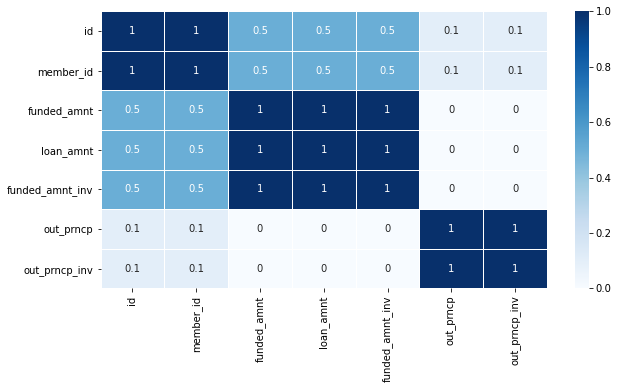

In [28]:
plt.figure(figsize=(10,5.10))
sns.heatmap(round(data.corr(),1),annot=True,cmap='Blues',linewidth=0.9)
plt.show()

# Complaints dataset

## EDA

In [38]:
c_plts = pd.read_csv("/Users/suzylau/Downloads/archive-3/consumer_complaints.csv")

/var/folders/66/qq6y4h9x2v91kpgp9hv1rh3r0000gn/T/ipykernel_30062/1850259472.py:1: DtypeWarning: Columns (5,11) have mixed types. Specify dtype option on import or set low_memory=False.
  c_plts = pd.read_csv("/Users/suzylau/Downloads/archive-3/consumer_complaints.csv")


In [39]:
c_plts.head()

,date_received,product,sub_product,issue,sub_issue,consumer_complaint_narrative,company_public_response,company,state,zipcode,tags,consumer_consent_provided,submitted_via,date_sent_to_company,company_response_to_consumer,timely_response,consumer_disputed?,complaint_id
0,08/30/2013,Mortgage,Other mortgage,"Loan modification,collection,foreclosure",NaN,NaN,NaN,U.S. Bancorp,CA,95993,NaN,NaN,Referral,09/03/2013,Closed with explanation,Yes,Yes,511074
1,08/30/2013,Mortgage,Other mortgage,"Loan servicing, payments, escrow account",NaN,NaN,NaN,Wells Fargo & Company,CA,91104,NaN,NaN,Referral,09/03/2013,Closed with explanation,Yes,Yes,511080
2,08/30/2013,Credit reporting,NaN,Incorrect information on credit report,Account status,NaN,NaN,Wells Fargo & Company,NY,11764,NaN,NaN,Postal mail,09/18/2013,Closed with explanation,Yes,No,510473
3,08/30/2013,Student loan,Non-federal student loan,Repaying your loan,Repaying your loan,NaN,NaN,"Navient Solutions, Inc.",MD,21402,NaN,NaN,Email,08/30/2013,Closed with explanation,Yes,Yes,510326
4,08/30/2013,Debt collection,Credit card,False statements or representation,Attempted to collect wrong amount,NaN,NaN,Resurgent Capital Services L.P.,GA,30106,NaN,NaN,Web,08/30/2013,Closed with explanation,Yes,Yes,511067


In [4]:
c_plts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555957 entries, 0 to 555956
Data columns (total 18 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   date_received                 555957 non-null  object
 1   product                       555957 non-null  object
 2   sub_product                   397635 non-null  object
 3   issue                         555957 non-null  object
 4   sub_issue                     212622 non-null  object
 5   consumer_complaint_narrative  66806 non-null   object
 6   company_public_response       85124 non-null   object
 7   company                       555957 non-null  object
 8   state                         551070 non-null  object
 9   zipcode                       551452 non-null  object
 10  tags                          77959 non-null   object
 11  consumer_consent_provided     123458 non-null  object
 12  submitted_via                 555957 non-null  object
 13 

In [6]:
c_plts.isnull().sum()

date_received                        0
product                              0
sub_product                     158322
issue                                0
sub_issue                       343335
consumer_complaint_narrative    489151
company_public_response         470833
company                              0
state                             4887
zipcode                           4505
tags                            477998
consumer_consent_provided       432499
submitted_via                        0
date_sent_to_company                 0
company_response_to_consumer         0
timely_response                      0
consumer_disputed?                   0
complaint_id                         0
dtype: int64

In [40]:
col_null = ['consumer_complaint_narrative','company_public_response','tags','consumer_consent_provided', 'sub_product'
           , 'sub_issue']
c_plts = c_plts.drop(columns=col_null, axis=1)

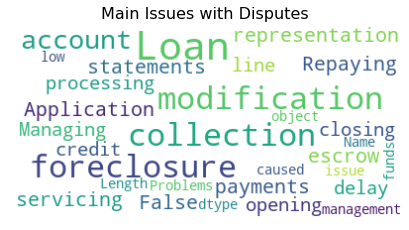

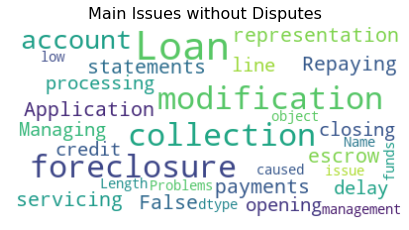

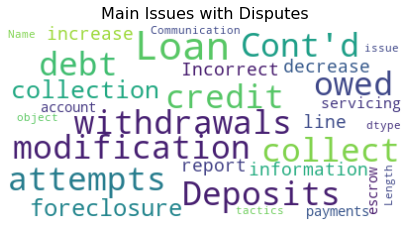

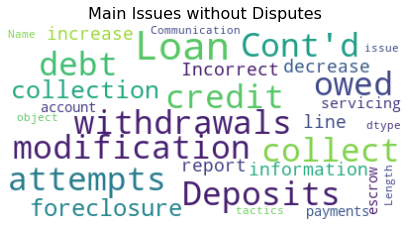

In [15]:
from wordcloud import WordCloud,STOPWORDS,ImageColorGenerator
from PIL import Image

stopwords = set(STOPWORDS)

def wc(data,title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=200,
        max_font_size=40,
        random_state=42
    ).generate(str(data))
    
    fig = plt.figure(1, figsize=(16,8))
    fig.add_subplot(221)
    plt.axis('off')
    plt.imshow(wordcloud,interpolation='bilinear')
    plt.title('Main Issues with Disputes', fontsize=16)
    plt.show()
    
    fig = plt.figure(1, figsize=(16,8))
    fig.add_subplot(222)
    plt.axis('off')
    plt.imshow(wordcloud,interpolation='bilinear')
    plt.title('Main Issues without Disputes', fontsize=16)
    plt.show()
    
    
    
wc(c_plts['issue'].loc[c_plts['consumer_disputed?'] == 'Yes'])

wc(c_plts['issue'].loc[c_plts['consumer_disputed?'] == 'No'])

In [7]:
import nltk
nltk.download('stopwords')

from nltk.corpus import stopwords
stop = stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/suzylau/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [8]:
from nltk.tokenize import RegexpTokenizer
tokenizer = RegexpTokenizer(r'\w+')

In [ ]:
import contractions, re
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import TweetTokenizer

nltk.download('wordnet')

porter_stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()

def clean_tokenization(text):
    return tokenizer.tokenize(text)
   
def clean_punct(text):
    text = re.sub(r'\w+', ' ', text)
    return text

def remove_numbers(text):
    text = re.sub(r"\b\d+\b *|\b[a-z]\b *", ' ', text)
    return text
    
def remove_single_char(text):
    single_char_pattern = r'\s+[a-zA-Z]\s+'
    without_sc = re.sub(pattern=single_char_pattern, repl=" ", string=text)
    return without_sc

def remove_stopw(text):
    if text not in stop:
        return text



In [ ]:
def nlp_pre(data):
    
    temp = []
    
    character_text = data.tolist()
    character_text = [j for i in character_text for j in i.split(" ") ]
    character_text = ' '.join(character_text)

    #Lower Case
    tokens = character_text.lower()
    
    #Expand Contractions
    tokens = contractions.fix(tokens) 
    
    #Remove numbers and special characters
    tokens = remove_numbers(tokens)
    tokens = remove_single_char(tokens)
        
    #Tokenization
    tokens = clean_tokenization(tokens)
        
    #Lemmatization
    tokens = [lemmatizer.lemmatize(word = x, pos='v') for x in tokens]
    tokens = [lemmatizer.lemmatize(word = x, pos='n') for x in tokens]

    #Stemming
    tokens = [porter_stemmer.stem(word = x) for x in tokens]

    #Remove Stopwords
    tokens = [remove_stopw(x) for x in tokens]
    
    #Remove None value
    for i in tokens:
         if i != None and i!= ' ':
            temp.append(i)  
            
    tokens = temp.copy()
    
    return tokens

In [ ]:
issue_token = nlp_pre(c_plts.issue)

In [ ]:
issue_token[:10]

In [ ]:
from nltk import FreqDist

def most_common (token, num):
    token_freq = FreqDist(token)
    top = token_freq.most_common(num)
    return top

In [14]:
top_words = most_common(issue_token, 100)

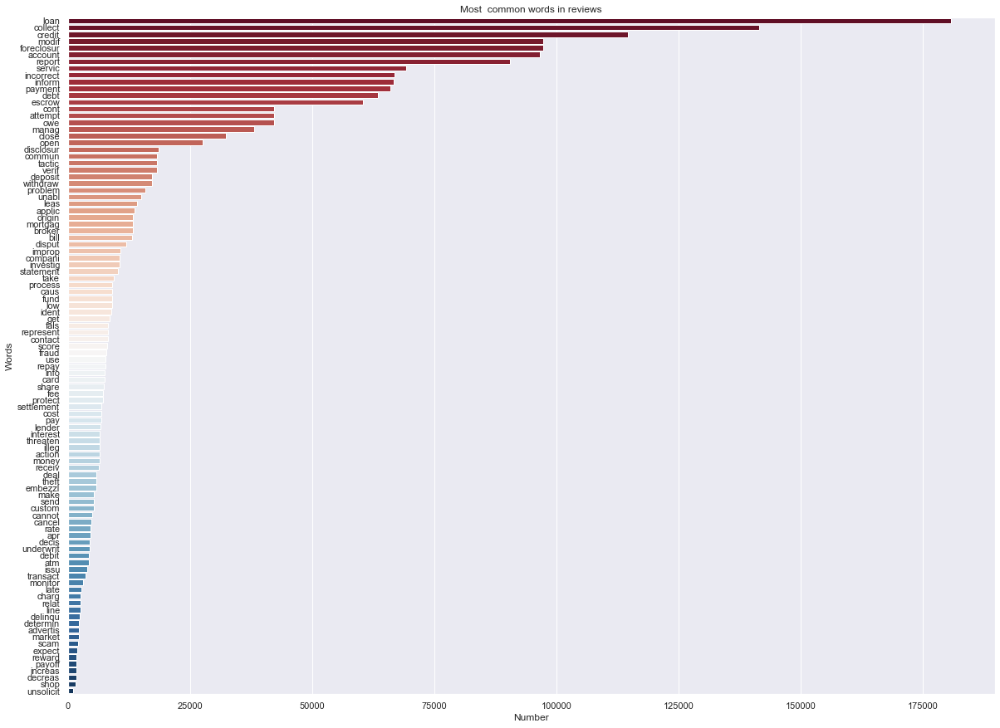

In [16]:
sns.set(rc={'figure.figsize':(20,15)})

sns.barplot(x = [x[1] for x in top_words],
            y = [x[0] for x in top_words],
            palette = 'RdBu')

plt.xlabel('Number')
plt.ylabel('Words')
plt.title('Most  common words in reviews')
plt.show()

# CTGAN-Model

In [7]:
c_plts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555957 entries, 0 to 555956
Data columns (total 12 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   date_received                 555957 non-null  object
 1   product                       555957 non-null  object
 2   issue                         555957 non-null  object
 3   company                       555957 non-null  object
 4   state                         551070 non-null  object
 5   zipcode                       551452 non-null  object
 6   submitted_via                 555957 non-null  object
 7   date_sent_to_company          555957 non-null  object
 8   company_response_to_consumer  555957 non-null  object
 9   timely_response               555957 non-null  object
 10  consumer_disputed?            555957 non-null  object
 11  complaint_id                  555957 non-null  int64 
dtypes: int64(1), object(11)
memory usage: 50.9+ MB


In [41]:
c_plts.drop(columns=['date_received', 'state', 'zipcode','date_sent_to_company', 
                      'timely_response','consumer_disputed?'], inplace=True)

In [42]:
categorical_features = [ 'product', 'issue', 'company', 
                        'submitted_via', 'company_response_to_consumer']

In [47]:
complaints1 = c_plts.sample(frac=1).reset_index(drop=True)[0:10000]

In [44]:
!pip install ctgan
!pip install table_evaluator

In [40]:
from ctgan import CTGANSynthesizer

In [48]:
ctgan = CTGANSynthesizer(verbose=True)
ctgan.fit(complaints1, categorical_features, epochs = 100)

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/rdt/transformers/base.py:156: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data[columns] = columns_data
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/rdt/transformers/base.py:156: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To g

Epoch 1, Loss G:  3.3850,Loss D: -0.2421
Epoch 2, Loss G:  3.7247,Loss D: -0.2855
Epoch 3, Loss G:  3.5605,Loss D: -0.3358
Epoch 4, Loss G:  3.2598,Loss D: -0.1370
Epoch 5, Loss G:  3.3239,Loss D: -0.0806
Epoch 6, Loss G:  3.1372,Loss D: -0.0154
Epoch 7, Loss G:  3.1252,Loss D:  0.0189
Epoch 8, Loss G:  2.5730,Loss D:  0.0898
Epoch 9, Loss G:  2.6151,Loss D: -0.0084
Epoch 10, Loss G:  2.3108,Loss D:  0.0282
Epoch 11, Loss G:  2.0153,Loss D:  0.0556
Epoch 12, Loss G:  1.9880,Loss D: -0.0878
Epoch 13, Loss G:  2.0241,Loss D:  0.0231
Epoch 14, Loss G:  1.4620,Loss D:  0.0995
Epoch 15, Loss G:  1.9369,Loss D: -0.0679
Epoch 16, Loss G:  1.5977,Loss D:  0.0472
Epoch 17, Loss G:  1.4529,Loss D:  0.0089
Epoch 18, Loss G:  1.4375,Loss D: -0.0090
Epoch 19, Loss G:  1.1176,Loss D:  0.0974
Epoch 20, Loss G:  1.1217,Loss D:  0.0126
Epoch 21, Loss G:  1.1972,Loss D:  0.0188
Epoch 22, Loss G:  1.0927,Loss D:  0.0344
Epoch 23, Loss G:  0.9252,Loss D:  0.0361
Epoch 24, Loss G:  0.9382,Loss D: -0.0588
E

In [49]:
samples = ctgan.sample(10000)
print(samples.head())

           product                                     issue  \
0  Debt collection                              Adding money   
1  Debt collection     Cont'd attempts collect debt not owed   
2         Mortgage  Loan modification,collection,foreclosure   
3      Credit card     Identity theft / Fraud / Embezzlement   
4  Debt collection     Cont'd attempts collect debt not owed   

                                   company submitted_via  \
0  Nationwide Biweekly Administration, Inc           Web   
1                                  Equifax           Web   
2                    Wells Fargo & Company      Referral   
3                     Encore Capital Group           Web   
4                      Nationstar Mortgage         Phone   

      company_response_to_consumer  complaint_id  
0  Closed with non-monetary relief       1916984  
1          Closed with explanation       1496948  
2            Closed without relief         -9710  
3  Closed with non-monetary relief       1107790  

(10000, 6) (10000, 6)


/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:125: UserWarning: Glyph 128 (\x80) missing from current font.
  plt.tight_layout(rect=[0, 0.02, 1, 0.98])
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:125: UserWarning: Glyph 153 (\x99) missing from current font.
  plt.tight_layout(rect=[0, 0.02, 1, 0.98])
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:125: UserWarning: Glyph 148 (\x94) missing from current font.
  plt.tight_layout(rect=[0, 0.02, 1, 0.98])


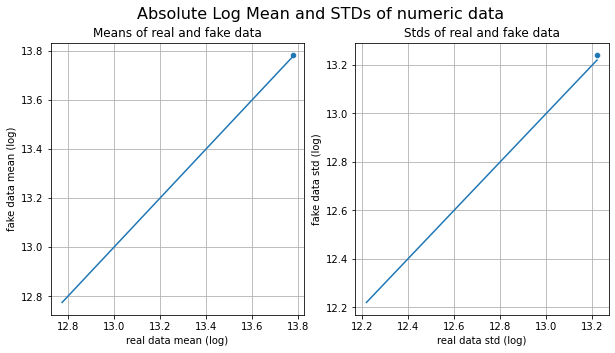

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128 (\x80) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 153 (\x99) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 148 (\x94) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


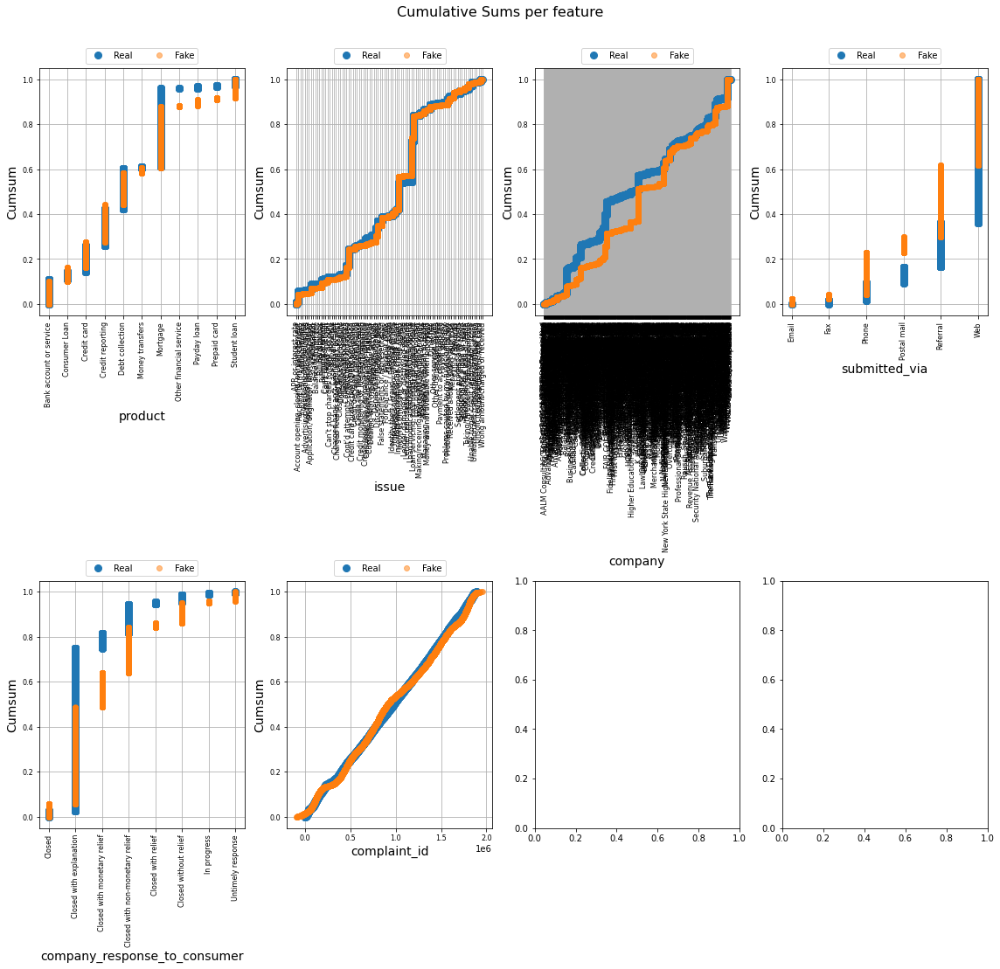

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:156: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  plot_df = pd.DataFrame({col: self.real[col].append(self.fake[col]), 'kind': ['real'] * self.n_samples + ['fake'] * self.n_samples})
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:176: UserWarning: Glyph 128 (\x80) missing from current font.
  plt.tight_layout(rect=[0, 0.02, 1, 0.98])
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:176: UserWarning: Glyph 148 (\x94) missing from current font.
  plt.tight_layout(rect=[0, 0.02, 1, 0.98])
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:176: UserWarning: Glyph 153 (\x99) missing from current font.
  plt.tight_layou

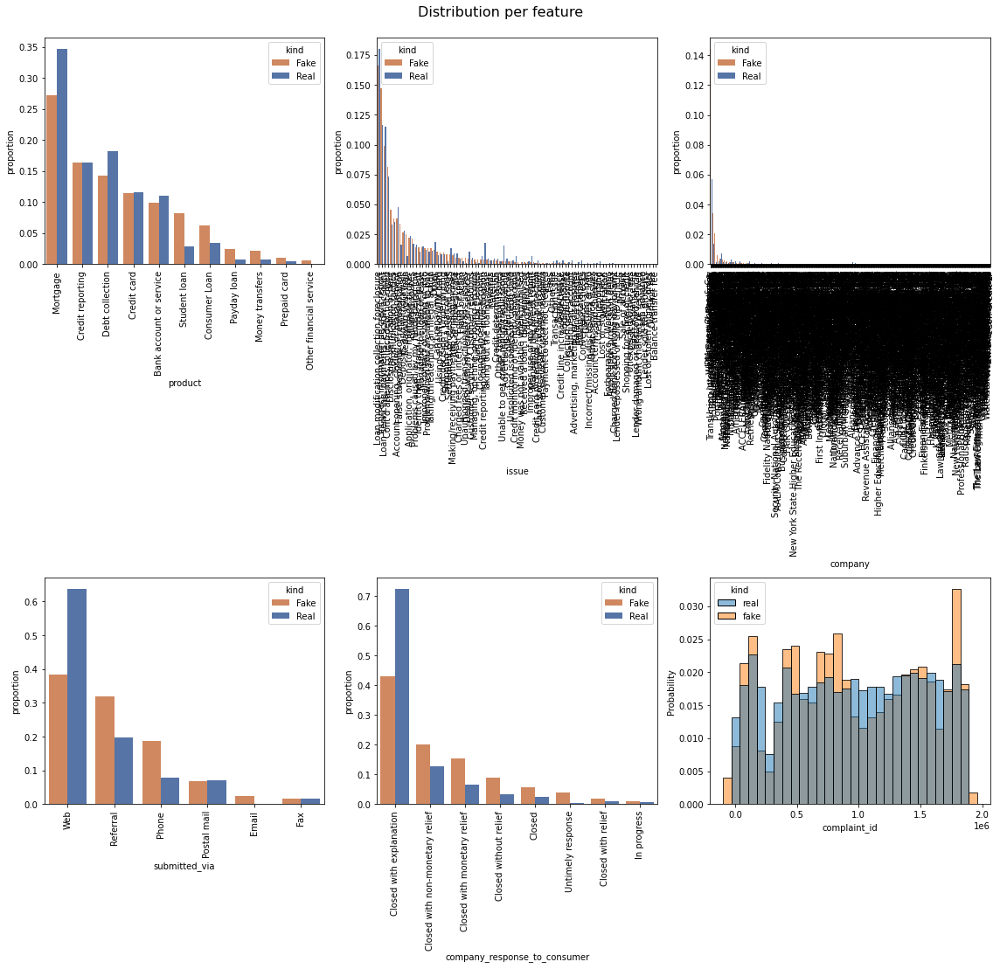

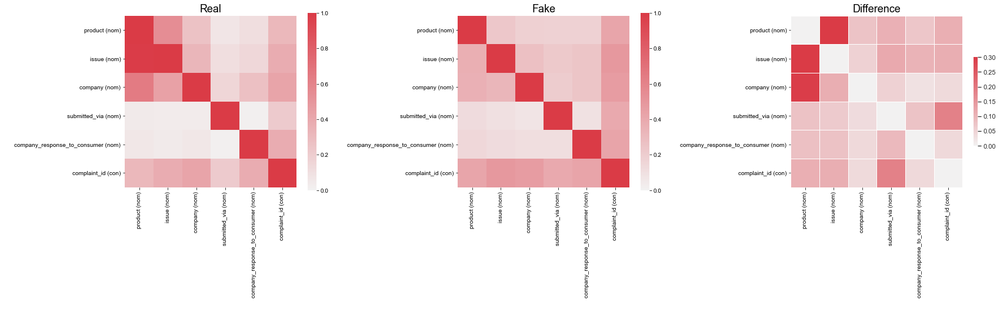

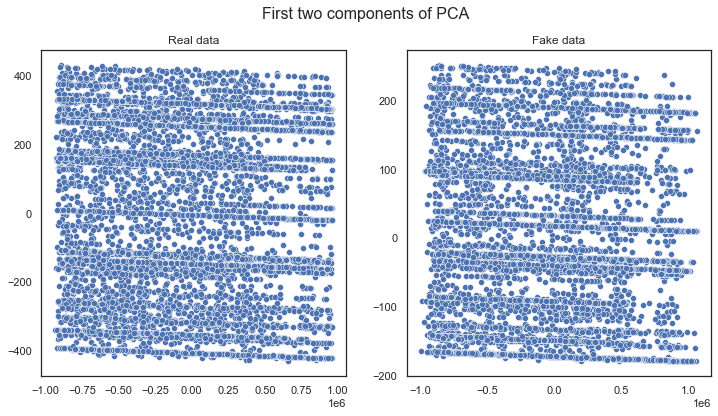

In [50]:
from table_evaluator import load_data, TableEvaluator

print(complaints1.shape, samples.shape)
table_evaluator =  TableEvaluator(complaints1, samples, cat_cols= categorical_features)

table_evaluator.visual_evaluation()

## Text preprocessing

In [51]:
# Punctuation removal
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [52]:
def remove_punctuation(text):
    punctuationfree="".join([i for i in text if i not in string.punctuation])
    return punctuationfree
c_plts['issue']= c_plts['issue'].apply(lambda x:remove_punctuation(x))
c_plts['issue'].head()

0    Loan modificationcollectionforeclosure
1    Loan servicing payments escrow account
2    Incorrect information on credit report
3                        Repaying your loan
4        False statements or representation
Name: issue, dtype: object

In [53]:
# Lowering the text
c_plts['issue'] = c_plts['issue'].apply(lambda x: x.lower())
c_plts['issue'].head()

0    loan modificationcollectionforeclosure
1    loan servicing payments escrow account
2    incorrect information on credit report
3                        repaying your loan
4        false statements or representation
Name: issue, dtype: object

In [54]:
# Tokenization
import re
def tokenization(text):
    tokens = re.split('W+',text)
    return tokens
#applying function to the column
c_plts['issue'] = c_plts['issue'].apply(lambda x: tokenization(x))

In [55]:
# Remove stopwords
import nltk
stopwords = nltk.corpus.stopwords.words('english')
stopwords[0:10]
['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [56]:
def remove_stopwords(text):
    output= [i for i in text if i not in stopwords]
    return output

In [57]:
c_plts['issue'] = c_plts['issue'].apply(lambda x:remove_stopwords(x))
c_plts['issue'].head()

0    [loan modificationcollectionforeclosure]
1    [loan servicing payments escrow account]
2    [incorrect information on credit report]
3                        [repaying your loan]
4        [false statements or representation]
Name: issue, dtype: object

In [58]:
# Stemming
from nltk.stem.porter import PorterStemmer
porter_stemmer = PorterStemmer()

In [59]:
def stemming(text):
    
    stem_text = [porter_stemmer.stem(word) for word in text]
    return stem_text

In [60]:
c_plts['issue'] = c_plts['issue'].apply(lambda x: stemming(x))


In [61]:
# Lemmatization
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

In [62]:
def lemmatizer(text):
    lemm_text = [wordnet_lemmatizer.lemmatize(word) for word in text]
    return lemm_text
c_plts['issue'] = c_plts['issue'].apply(lambda x:lemmatizer(x))

In [63]:
c_plts['issue'].head()

0     [loan modificationcollectionforeclosur]
1    [loan servicing payments escrow account]
2    [incorrect information on credit report]
3                        [repaying your loan]
4             [false statements or represent]
Name: issue, dtype: object

In [69]:
c_plts = c_plts.explode("issue", ignore_index=True)

## Text feature engineering

In [64]:
# Creating new features
c_plts['num_words'] = c_plts['issue'].apply(lambda x: len(str(x).split()))

In [65]:
c_plts[['issue', 'num_words']].head

<bound method NDFrame.head of                                            issue  num_words
0        [loan modificationcollectionforeclosur]          2
1       [loan servicing payments escrow account]          5
2       [incorrect information on credit report]          5
3                           [repaying your loan]          3
4                [false statements or represent]          4
...                                          ...        ...
555952   [loan modificationcollectionforeclosur]          2
555953  [loan servicing payments escrow account]          5
555954   [loan modificationcollectionforeclosur]          2
555955                      [communication tact]          2
555956      [contd attempts collect debt not ow]          6

[555957 rows x 2 columns]>

In [66]:
# Number of unique words
c_plts['num_uniq'] = c_plts['issue'].apply(lambda x: len(set(str(x).split())))
c_plts[['issue','num_uniq']].head()

,issue,num_uniq
0,[loan modificationcollectionforeclosur],2
1,[loan servicing payments escrow account],5
2,[incorrect information on credit report],5
3,[repaying your loan],3
4,[false statements or represent],4


In [26]:
c_plts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555957 entries, 0 to 555956
Data columns (total 8 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   product                       555957 non-null  object
 1   issue                         555957 non-null  object
 2   company                       555957 non-null  object
 3   submitted_via                 555957 non-null  object
 4   company_response_to_consumer  555957 non-null  object
 5   complaint_id                  555957 non-null  int64 
 6   num_words                     555957 non-null  int64 
 7   num_uniq                      555957 non-null  int64 
dtypes: int64(3), object(5)
memory usage: 33.9+ MB


In [58]:
c_plts.head()

,product,issue,company,submitted_via,company_response_to_consumer,complaint_id,num_words,num_uniq
0,Mortgage,loan modificationcollectionforeclosur,U.S. Bancorp,Referral,Closed with explanation,511074,2,2
1,Mortgage,loan servicing payments escrow account,Wells Fargo & Company,Referral,Closed with explanation,511080,5,5
2,Credit reporting,incorrect information on credit report,Wells Fargo & Company,Postal mail,Closed with explanation,510473,5,5
3,Student loan,repaying your loan,"Navient Solutions, Inc.",Email,Closed with explanation,510326,3,3
4,Debt collection,false statements or represent,Resurgent Capital Services L.P.,Web,Closed with explanation,511067,4,4


In [54]:
c_plts['issue'].head()

0     [loan modificationcollectionforeclosur]
1    [loan servicing payments escrow account]
2    [incorrect information on credit report]
3                        [repaying your loan]
4             [false statements or represent]
Name: issue, dtype: object

## CTGAN model after text preprocessing and feature engineering

In [71]:
categorical_features = [ 'product', 'issue', 'company', 
                        'submitted_via', 'company_response_to_consumer']

In [72]:
complaints2 = c_plts.sample(frac=1).reset_index(drop=True)[0:10000]

In [73]:
ctgan = CTGANSynthesizer(verbose=True)
ctgan.fit(complaints2, categorical_features, epochs = 100)

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:143: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  cluster.KMeans(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:143: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  cluster.KMeans(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/rdt/transformers/base.py:156: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor pe

Epoch 1, Loss G:  3.2676,Loss D: -0.2636
Epoch 2, Loss G:  3.3402,Loss D: -0.2239
Epoch 3, Loss G:  3.2913,Loss D: -0.1697
Epoch 4, Loss G:  3.1713,Loss D: -0.1059
Epoch 5, Loss G:  3.1095,Loss D: -0.1143
Epoch 6, Loss G:  2.7509,Loss D: -0.0267
Epoch 7, Loss G:  2.6673,Loss D:  0.1049
Epoch 8, Loss G:  2.3858,Loss D: -0.0061
Epoch 9, Loss G:  2.4145,Loss D: -0.0104
Epoch 10, Loss G:  1.7315,Loss D:  0.1452
Epoch 11, Loss G:  1.9344,Loss D: -0.0800
Epoch 12, Loss G:  1.7120,Loss D: -0.0882
Epoch 13, Loss G:  1.2942,Loss D:  0.0952
Epoch 14, Loss G:  1.4515,Loss D:  0.0086
Epoch 15, Loss G:  1.2844,Loss D: -0.0939
Epoch 16, Loss G:  1.2785,Loss D: -0.0372
Epoch 17, Loss G:  0.7744,Loss D:  0.0959
Epoch 18, Loss G:  0.8610,Loss D: -0.0427
Epoch 19, Loss G:  0.6933,Loss D:  0.0157
Epoch 20, Loss G:  0.7724,Loss D:  0.0705
Epoch 21, Loss G:  0.7297,Loss D: -0.0499
Epoch 22, Loss G:  0.7662,Loss D:  0.1675
Epoch 23, Loss G:  0.5439,Loss D: -0.1152
Epoch 24, Loss G:  0.4372,Loss D:  0.0583
E

In [74]:
samples = ctgan.sample(10000)
print(samples.head())

           product                                   issue  \
0         Mortgage  loan servicing payments escrow account   
1      Credit card   loan modificationcollectionforeclosur   
2      Payday loan                                 late fe   
3  Debt collection           false statements or represent   
4  Debt collection         disclosure verification of debt   

                                     company submitted_via  \
0                      PayPal Holdings, Inc.      Referral   
1                            Bank of America   Postal mail   
2                       Ditech Financial LLC           Web   
3                      Wells Fargo & Company           Web   
4  The Law Offices of Barry J. Gammons, PLLC           Web   

      company_response_to_consumer  complaint_id  num_words  num_uniq  
0          Closed with explanation        843253          5         5  
1            Closed without relief        428558          2         2  
2                           Closed    

(10000, 8) (10000, 8)


/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:125: UserWarning: Glyph 128 (\x80) missing from current font.
  plt.tight_layout(rect=[0, 0.02, 1, 0.98])
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:125: UserWarning: Glyph 153 (\x99) missing from current font.
  plt.tight_layout(rect=[0, 0.02, 1, 0.98])


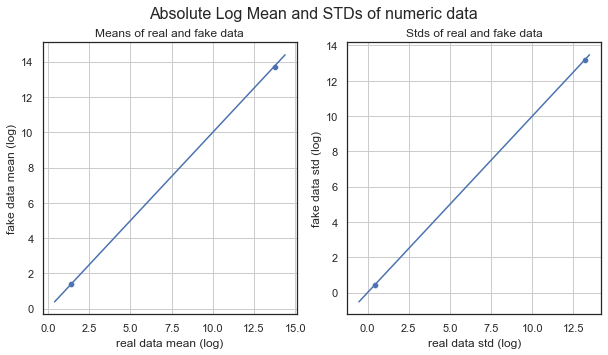

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128 (\x80) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 153 (\x99) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


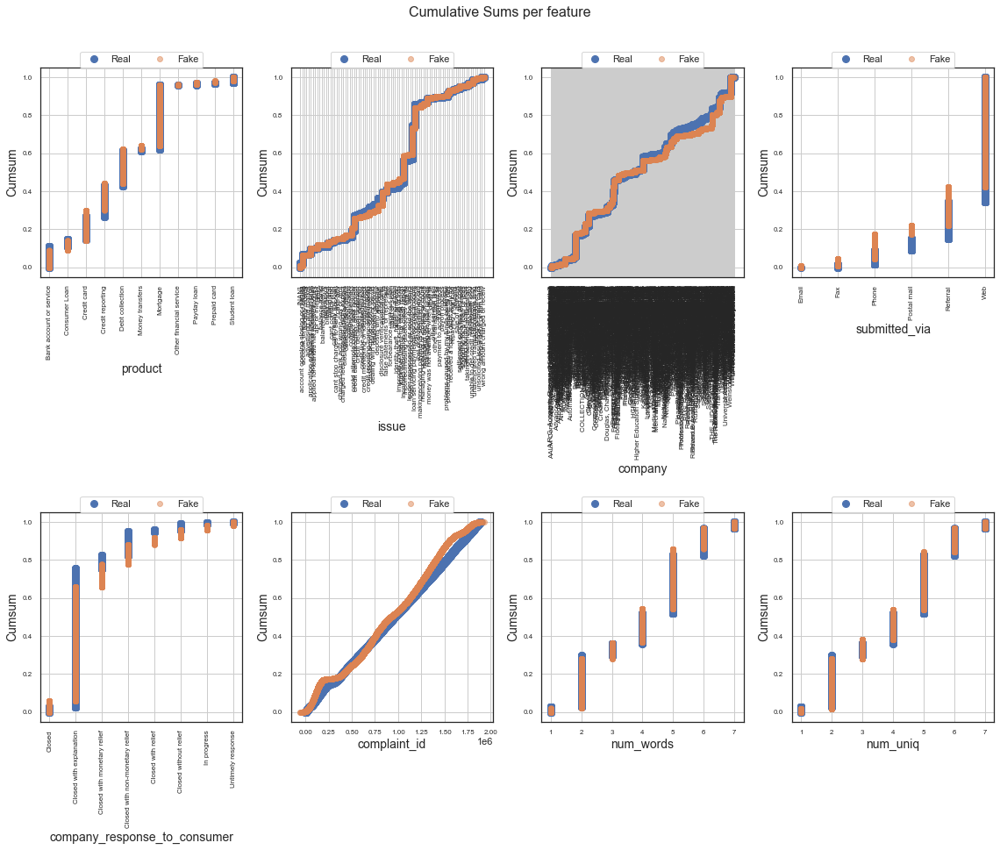

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:156: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  plot_df = pd.DataFrame({col: self.real[col].append(self.fake[col]), 'kind': ['real'] * self.n_samples + ['fake'] * self.n_samples})
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:156: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  plot_df = pd.DataFrame({col: self.real[col].append(self.fake[col]), 'kind': ['real'] * self.n_samples + ['fake'] * self.n_samples})
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/table_evaluator/table_evaluator.py:156: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

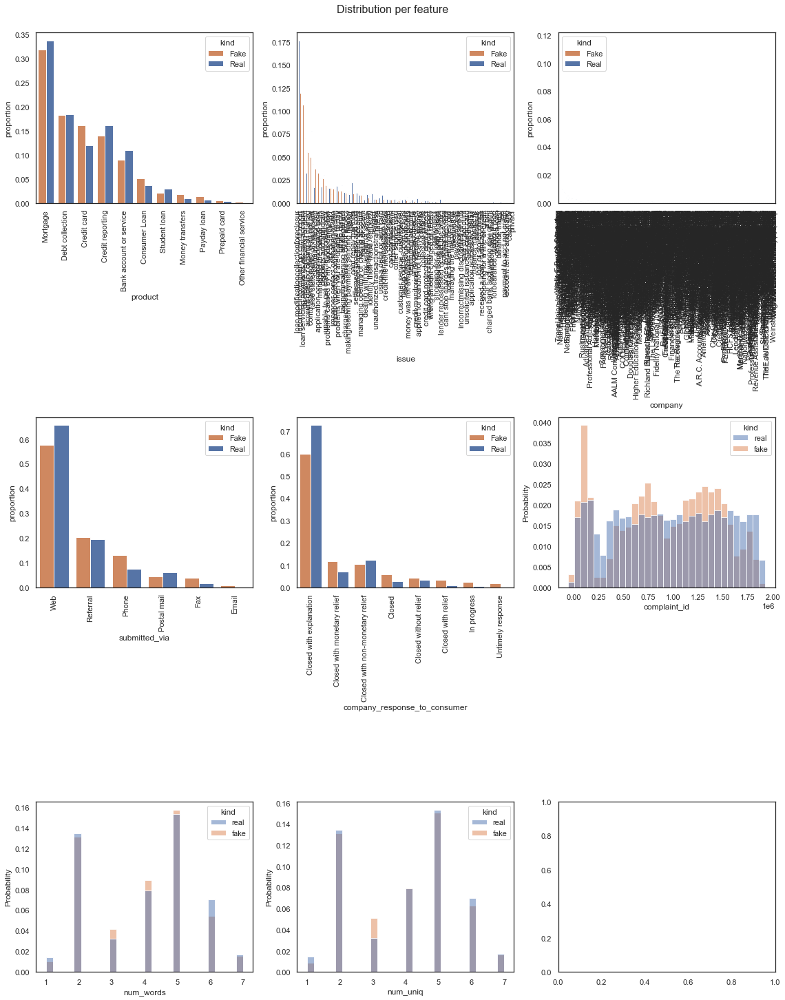

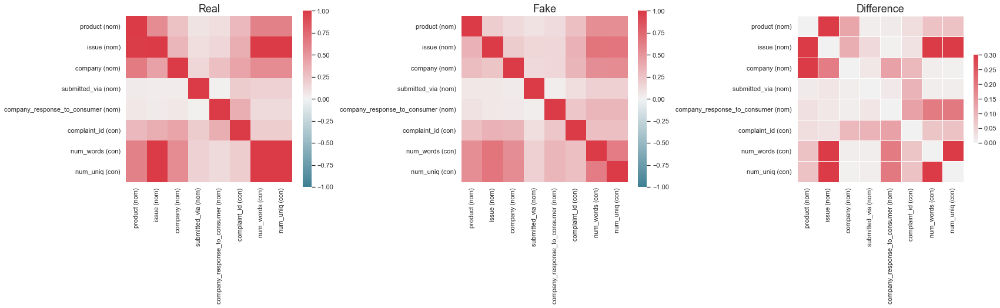

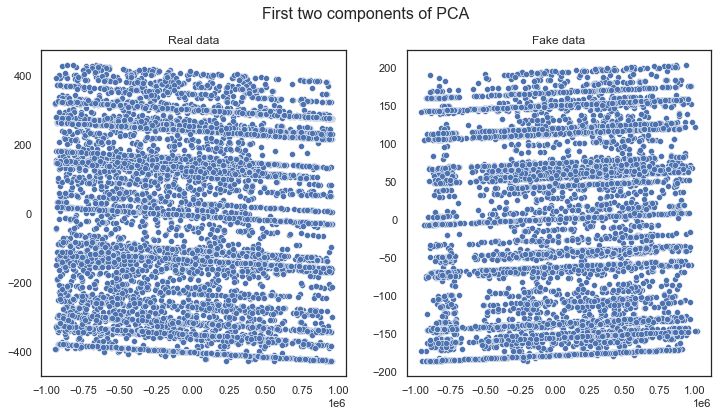

In [75]:
from table_evaluator import load_data, TableEvaluator

print(complaints2.shape, samples.shape)
table_evaluator =  TableEvaluator(complaints2, samples, cat_cols= categorical_features)

table_evaluator.visual_evaluation()

## Hyperparameter tuning

In [39]:
model2 = CTGANSynthesizer(verbose=True, 
                         epochs = 300,
                         batch_size = 100,
                         generator_dim=(256, 256, 256),
                         discriminator_dim=(256, 256, 256))

In [40]:
model2.fit(loan)

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter,

Epoch 1, Loss G: -0.7955,Loss D:  0.2966
Epoch 2, Loss G: -0.5850,Loss D:  0.1585
Epoch 3, Loss G: -1.4723,Loss D:  0.0144
Epoch 4, Loss G: -1.9964,Loss D: -0.2903
Epoch 5, Loss G: -2.7251,Loss D:  0.2776
Epoch 6, Loss G: -2.8721,Loss D: -0.1790
Epoch 7, Loss G: -3.2243,Loss D: -0.3540
Epoch 8, Loss G: -3.7440,Loss D:  0.3119
Epoch 9, Loss G: -4.2204,Loss D: -0.7038
Epoch 10, Loss G: -3.7803,Loss D:  0.4681
Epoch 11, Loss G: -3.9763,Loss D:  0.4086
Epoch 12, Loss G: -4.2266,Loss D:  0.1512
Epoch 13, Loss G: -3.4911,Loss D: -0.2821
Epoch 14, Loss G: -4.2637,Loss D: -0.2414
Epoch 15, Loss G: -3.2388,Loss D:  0.2477
Epoch 16, Loss G: -4.9133,Loss D:  0.2243
Epoch 17, Loss G: -4.3000,Loss D: -0.1678
Epoch 18, Loss G: -4.2960,Loss D:  0.5060
Epoch 19, Loss G: -4.0692,Loss D:  0.7112
Epoch 20, Loss G: -4.0697,Loss D:  1.0404
Epoch 21, Loss G: -3.9390,Loss D: -0.2470
Epoch 22, Loss G: -4.4256,Loss D:  0.1693
Epoch 23, Loss G: -4.4538,Loss D:  0.5058
Epoch 24, Loss G: -4.0330,Loss D:  0.1288
E

In [41]:
new_data4 = model.sample(10000)
print(new_data4.head())

        id   funded_amnt   int_rate  installment     annual_inc        dti  \
0   884953  11757.804541   6.719442   606.537568  101977.342055  14.418799   
1   979286  11623.128410  15.068006   276.546399   46913.720519  15.948192   
2   870018  14029.932849   7.607078  1046.873268   85141.970291  11.011333   
3   874608  20201.524083   9.388673    99.271878   63076.249713  21.289388   
4  1027670  16144.476612  10.132762   591.816969   36190.300958  11.307137   

   delinq_2yrs  inq_last_6mths   open_acc   pub_rec  ...  policy_code  \
0    -0.008830        3.078607  11.585884  0.001340  ...     1.000167   
1    -0.008840       -0.003921  20.011621  0.006994  ...     1.000277   
2     2.087713       -0.031372   7.064961 -0.001427  ...     0.999603   
3    -0.005698        2.805842   9.052382  0.925804  ...     0.997389   
4    -0.005096       -0.022669  11.894487  1.077751  ...     0.998473   

   acc_now_delinq  l_total_pymnt  l_total_pymnt_inv  l_total_rec_prncp  \
0        0.001616 

In [42]:
evaluate(new_data4, loan)

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/

0.4156682599334001

In [49]:
model3 = CTGANSynthesizer(verbose=True, 
                         epochs = 500,
                         batch_size = 50,
                         generator_dim=(256, 256, 256),
                         discriminator_dim=(256, 256, 256))

In [50]:
model3.fit(loan)

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter,

Epoch 1, Loss G: -0.2264,Loss D: -0.2604
Epoch 2, Loss G: -0.6213,Loss D: -0.0589
Epoch 3, Loss G: -0.4202,Loss D:  0.2682
Epoch 4, Loss G: -0.4714,Loss D:  0.2365
Epoch 5, Loss G: -0.3906,Loss D:  0.1935
Epoch 6, Loss G:  0.1085,Loss D: -0.2489
Epoch 7, Loss G: -0.2663,Loss D: -0.3464
Epoch 8, Loss G: -0.8801,Loss D: -0.4239
Epoch 9, Loss G: -1.0597,Loss D:  0.2311
Epoch 10, Loss G: -1.2473,Loss D:  0.2492
Epoch 11, Loss G: -1.5512,Loss D:  0.0077
Epoch 12, Loss G: -1.6344,Loss D:  0.2413
Epoch 13, Loss G: -2.1257,Loss D:  0.0367
Epoch 14, Loss G: -1.6477,Loss D:  0.0110
Epoch 15, Loss G: -1.9112,Loss D:  0.0999
Epoch 16, Loss G: -2.2467,Loss D:  0.3500
Epoch 17, Loss G: -1.9965,Loss D:  0.0080
Epoch 18, Loss G: -2.2619,Loss D: -0.0967
Epoch 19, Loss G: -2.5125,Loss D: -0.3454
Epoch 20, Loss G: -2.6836,Loss D:  0.2169
Epoch 21, Loss G: -1.9726,Loss D: -0.0128
Epoch 22, Loss G: -2.9194,Loss D:  0.2143
Epoch 23, Loss G: -3.1584,Loss D: -0.0002
Epoch 24, Loss G: -2.9168,Loss D: -0.1614
E

In [51]:
new_data5 = model3.sample(10000)
print(new_data5.head())

        id   funded_amnt   int_rate  installment     annual_inc        dti  \
0  1022220  14333.192534   6.007869   692.091891   82839.135622   4.832793   
1   871028   8383.704608   9.935414   142.160647   49045.988920  16.936890   
2   848622   3984.778057   9.627096   261.612065   45670.023953  10.824039   
3  1049225  12536.325630   9.941019   467.407686  193977.241306  22.318383   
4   853470  35712.005468  13.587717   483.546608   89115.073804  21.219840   

   delinq_2yrs  inq_last_6mths   open_acc   pub_rec  ...  policy_code  \
0     0.002551        2.000928  13.904972  0.000673  ...     1.000387   
1     0.001323        0.016819   9.739848 -0.000593  ...     1.000224   
2     0.002871        2.007737  11.701665 -0.000235  ...     1.000036   
3    -0.001460        0.001532   8.683206 -0.000107  ...     0.999452   
4     3.098159        1.017730  12.071717 -0.000600  ...     0.999656   

   acc_now_delinq  l_total_pymnt  l_total_pymnt_inv  l_total_rec_prncp  \
0       -0.000285 

In [52]:
evaluate(new_data5, loan)

/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/homebrew/Caskroom/miniforge/base/envs/dl/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/

0.4410437547326014